# Accessibility Feature Detection — Model Comparison

## Zero-shot (open-vocabulary) models
| # | Model | Variants |
|---|-------|---------|
| 1 | **YOLO-World** | S / M / L / X |
| 2 | **OWL-ViT v2** | Base / Large / Large-Ensemble |
| 3 | **GroundingDINO** | Tiny / Base |
| 4 | **GroundingDINO-Base + SAM 2** | boxes → pixel masks |

## Specialized (trained on accessibility/sidewalk data)
| # | Model | Task |
|---|-------|------|
| 5 | **Project Sidewalk** | curb ramp / surface problem / obstacle / crosswalk |

In [1]:
# Install dependencies (run once)
# !pip install ultralytics transformers torch torchvision Pillow matplotlib opencv-python
# !pip install sam2   # Meta SAM 2
# transformers >= 4.40 required for GroundingDINO, Florence-2, OWL-ViT v2

In [2]:
import os, warnings, gc
warnings.filterwarnings('ignore')

import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device : {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU    : {torch.cuda.get_device_name(0)}')
    print(f'VRAM   : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')

def free_gpu(*models):
    """Delete models and release VRAM between heavy sections."""
    for m in models:
        del m
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

Device : cuda
GPU    : NVIDIA GeForce RTX 2080
VRAM   : 8.6 GB


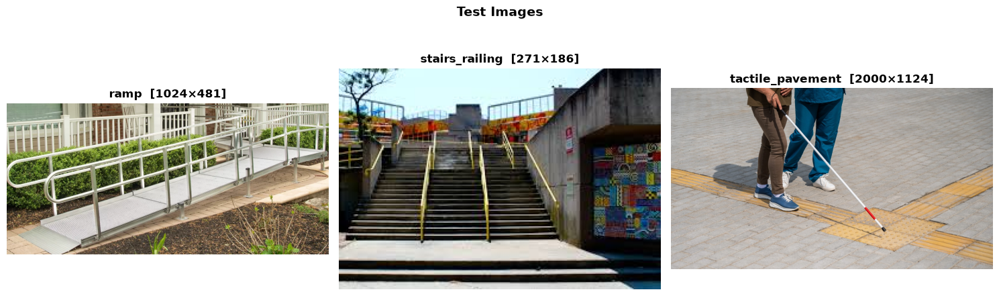

In [3]:
TEST_DIR = '../../../../datasets/test_classes'

IMAGE_PATHS = {
    'ramp':             os.path.join(TEST_DIR, 'ramp.png'),
    'stairs_railing':   os.path.join(TEST_DIR, 'stairs_railing.png'),
    'tactile_pavement': os.path.join(TEST_DIR, 'tactile_pavement.png'),
}

IMAGES = {name: Image.open(path).convert('RGB') for name, path in IMAGE_PATHS.items()}

# Zero-shot detection classes
CLASSES = [
    'accessible ramp for wheelchair users',
    'tactile ground surface indicator paving',
    'handrail or safety railing on stairs',
    'dropped kerb or curb cut for wheelchair',
    'staircase with steps',
    'wide entrance door for wheelchair access',
]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, (name, img) in zip(axes, IMAGES.items()):
    ax.imshow(img)
    ax.set_title(f'{name}  [{img.width}×{img.height}]', fontsize=12, fontweight='bold')
    ax.axis('off')
plt.suptitle('Test Images', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

In [4]:
COLORS = ['#e74c3c','#3498db','#2ecc71','#f39c12','#9b59b6','#1abc9c','#e67e22','#e91e63','#00bcd4']

def color_for(label):
    idx = CLASSES.index(label) if label in CLASSES else hash(label)
    return COLORS[idx % len(COLORS)]

def show_detections(images_dict, results_dict, title='Detections', score_thresh=0.0):
    """
    results_dict: { image_name: [{'label': str, 'score': float, 'box': [x0,y0,x1,y1]}, ...] }
    """
    fig, axes = plt.subplots(1, len(images_dict), figsize=(6*len(images_dict), 6))
    if len(images_dict) == 1: axes = [axes]
    for ax, (name, img) in zip(axes, images_dict.items()):
        ax.imshow(img)
        dets = [d for d in results_dict.get(name, []) if d['score'] >= score_thresh]
        for det in dets:
            x0, y0, x1, y1 = det['box']
            c = color_for(det['label'])
            ax.add_patch(patches.Rectangle((x0,y0), x1-x0, y1-y0, lw=2.5, edgecolor=c, facecolor='none'))
            ax.text(x0, max(y0-4,0), f"{det['label']} {det['score']:.2f}",
                    color='white', fontsize=8.5, fontweight='bold',
                    bbox=dict(facecolor=c, alpha=0.85, pad=1, edgecolor='none'))
        ax.set_title(f'{name}  [{len(dets)} det]', fontsize=11, fontweight='bold')
        ax.axis('off')
    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show()


def show_masks(images_dict, masks_dict, title='Segmentation'):
    """
    masks_dict: { image_name: [{'label': str, 'score': float, 'mask': np.bool_ H×W}, ...] }
    """
    fig, axes = plt.subplots(1, len(images_dict), figsize=(6*len(images_dict), 6))
    if len(images_dict) == 1: axes = [axes]
    for ax, (name, img) in zip(axes, images_dict.items()):
        overlay = np.array(img, dtype=np.float32) / 255.0
        for i, seg in enumerate(masks_dict.get(name, [])):
            mask = seg['mask']
            hex_c = COLORS[i % len(COLORS)].lstrip('#')
            clr = np.array([int(hex_c[j:j+2], 16)/255 for j in (0,2,4)])
            overlay[mask] = overlay[mask]*0.35 + clr*0.65
            ys, xs = np.where(mask)
            if len(xs):
                ax.text(xs.mean(), ys.mean(), f"{seg['label']}\n{seg['score']:.2f}",
                        ha='center', va='center', color='white', fontsize=8, fontweight='bold',
                        bbox=dict(facecolor=COLORS[i%len(COLORS)], alpha=0.75, pad=1, edgecolor='none'))
        ax.imshow(np.clip(overlay, 0, 1))
        ax.set_title(name, fontsize=11, fontweight='bold'); ax.axis('off')
    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show()


def show_segmentation_map(images_dict, seg_maps_dict, id2label, title='Semantic Segmentation'):
    """
    seg_maps_dict: { image_name: np.int H×W label indices }
    """
    n = len(images_dict)
    fig, axes = plt.subplots(2, n, figsize=(6*n, 10))
    palette = plt.cm.tab20(np.linspace(0, 1, max(len(id2label), 20)))
    for col, (name, img) in enumerate(images_dict.items()):
        axes[0][col].imshow(img)
        axes[0][col].set_title(f'{name} (original)', fontsize=11); axes[0][col].axis('off')
        seg = seg_maps_dict.get(name)
        if seg is not None:
            colored = palette[seg % 20][:, :, :3]
            axes[1][col].imshow(colored)
            # legend
            unique_ids = np.unique(seg)
            legend = [patches.Patch(color=palette[i % 20][:3], label=id2label.get(i, str(i))) for i in unique_ids[:12]]
            axes[1][col].legend(handles=legend, loc='lower left', fontsize=7, ncol=2,
                                framealpha=0.8, handlelength=1)
        axes[1][col].set_title(f'{name} (segmentation)', fontsize=11); axes[1][col].axis('off')
    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show()

---
## 1. YOLO-World  (S / M / L / X)
Real-time open-vocabulary detection. Tested at four scales so you can see the accuracy/speed trade-off.

── YOLO-World S ──
  ramp: []
  stairs_railing: []
  tactile_pavement: []


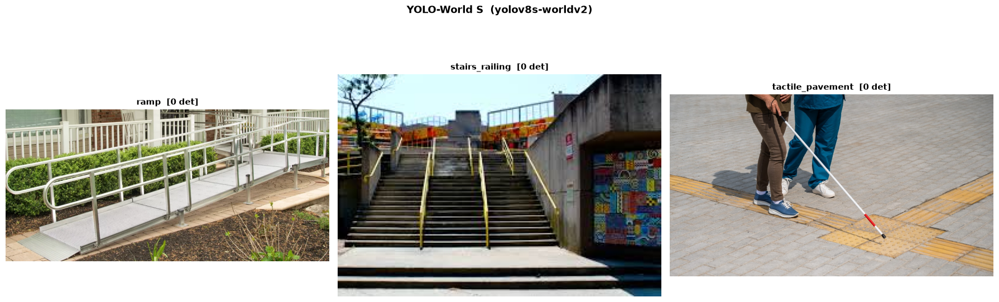

── YOLO-World M ──
  ramp: []
  stairs_railing: []
  tactile_pavement: []


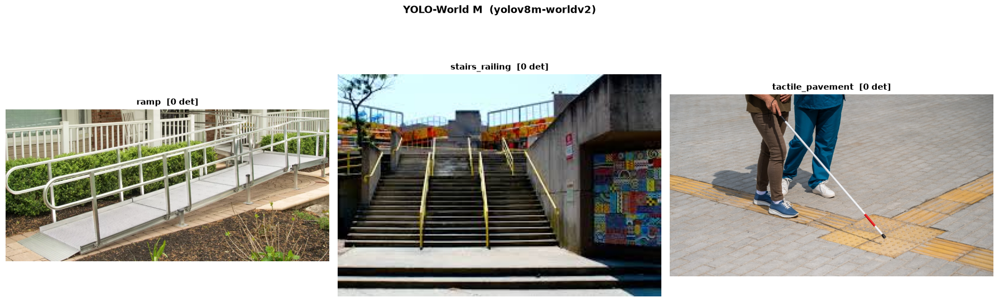

── YOLO-World L ──
  ramp: []
  stairs_railing: []
  tactile_pavement: []


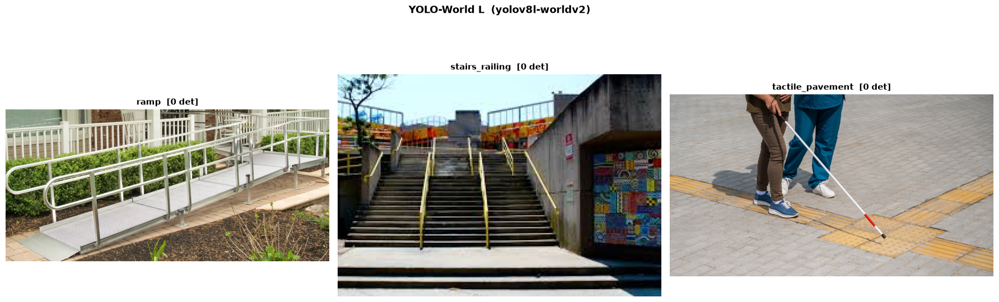

── YOLO-World X ──
  ramp: []
  stairs_railing: [('staircase with steps', 0.367), ('staircase with steps', 0.159)]
  tactile_pavement: []


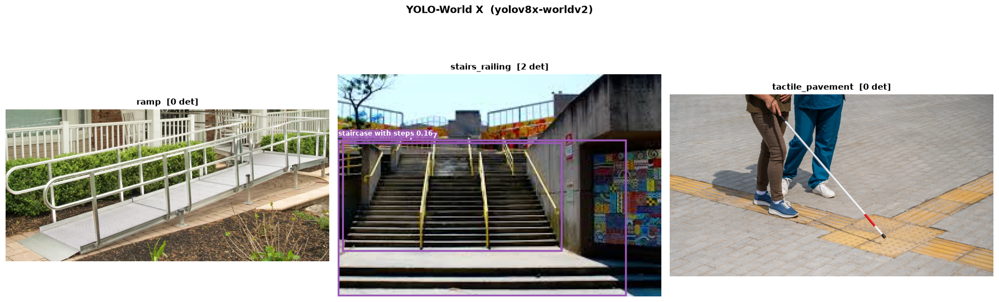

In [5]:
from ultralytics import YOLO

YOLO_VARIANTS = [
    ('yolov8s-worldv2', 'S'),
    ('yolov8m-worldv2', 'M'),
    ('yolov8l-worldv2', 'L'),
    ('yolov8x-worldv2', 'X'),
]

CONF = 0.15
yolo_results = {}   # keyed by variant label

for model_file, variant in YOLO_VARIANTS:
    print(f'── YOLO-World {variant} ──')
    m = YOLO(f'{model_file}.pt')
    m.set_classes(CLASSES)
    res_variant = {}
    for name, img in IMAGES.items():
        res = m.predict(img, conf=CONF, verbose=False)[0]
        dets = [
            {'label': CLASSES[int(b.cls.item())], 'score': round(float(b.conf.item()), 3),
             'box': [round(v, 1) for v in b.xyxy[0].tolist()]}
            for b in res.boxes
        ]
        res_variant[name] = dets
        print(f'  {name}: {[(d["label"], d["score"]) for d in dets]}')
    yolo_results[variant] = res_variant
    show_detections(IMAGES, res_variant, title=f'YOLO-World {variant}  ({model_file})', score_thresh=CONF)
    free_gpu(m)

---
## 2. OWL-ViT v2  (Base / Large / Large-Ensemble)
Google's zero-shot detector. Three sizes — ensemble is the most accurate OWLv2 released.

| Model | Params | VRAM | AP |
|-------|--------|------|----|
| `owlv2-base-patch16` | ~93M | ~0.5 GB | 44.6 |
| `owlv2-large-patch14` | ~307M | ~1.5 GB | 50.4 |
| `owlv2-large-patch14-ensemble` | ~307M | ~1.5 GB | **53.7** |

── owlv2-base-patch16 ──


Loading weights:   0%|          | 0/418 [00:00<?, ?it/s]

  ramp: [('wide entrance door for wheelchair access', 0.177), ('handrail or safety railing on stairs', 0.164), ('wide entrance door for wheelchair access', 0.161), ('handrail or safety railing on stairs', 0.118), ('handrail or safety railing on stairs', 0.153), ('wide entrance door for wheelchair access', 0.256), ('handrail or safety railing on stairs', 0.419), ('wide entrance door for wheelchair access', 0.104), ('staircase with steps', 0.141), ('staircase with steps', 0.161), ('handrail or safety railing on stairs', 0.195), ('staircase with steps', 0.206), ('handrail or safety railing on stairs', 0.169), ('staircase with steps', 0.109), ('tactile ground surface indicator paving', 0.136), ('tactile ground surface indicator paving', 0.176), ('tactile ground surface indicator paving', 0.225), ('tactile ground surface indicator paving', 0.108), ('tactile ground surface indicator paving', 0.149), ('tactile ground surface indicator paving', 0.14), ('tactile ground surface indicator paving'

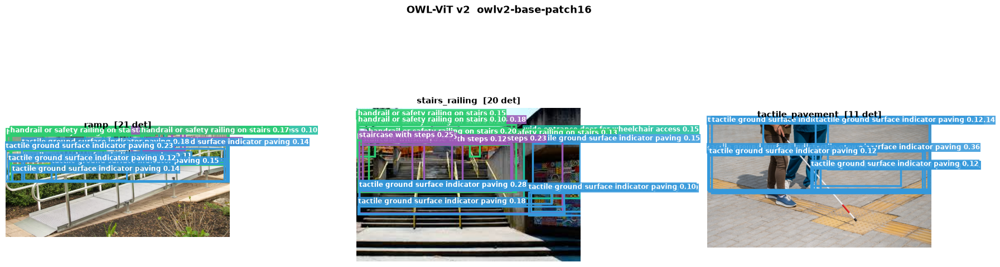

── owlv2-large-patch14 ──


Loading weights:   0%|          | 0/610 [00:00<?, ?it/s]

  ramp: [('wide entrance door for wheelchair access', 0.156), ('wide entrance door for wheelchair access', 0.124), ('handrail or safety railing on stairs', 0.297), ('handrail or safety railing on stairs', 0.116), ('handrail or safety railing on stairs', 0.174), ('handrail or safety railing on stairs', 0.143), ('handrail or safety railing on stairs', 0.103), ('wide entrance door for wheelchair access', 0.239), ('wide entrance door for wheelchair access', 0.126), ('handrail or safety railing on stairs', 0.137), ('handrail or safety railing on stairs', 0.235), ('handrail or safety railing on stairs', 0.156), ('staircase with steps', 0.123), ('accessible ramp for wheelchair users', 0.11), ('handrail or safety railing on stairs', 0.16), ('handrail or safety railing on stairs', 0.202), ('tactile ground surface indicator paving', 0.117), ('tactile ground surface indicator paving', 0.114), ('accessible ramp for wheelchair users', 0.109), ('tactile ground surface indicator paving', 0.189), ('ta

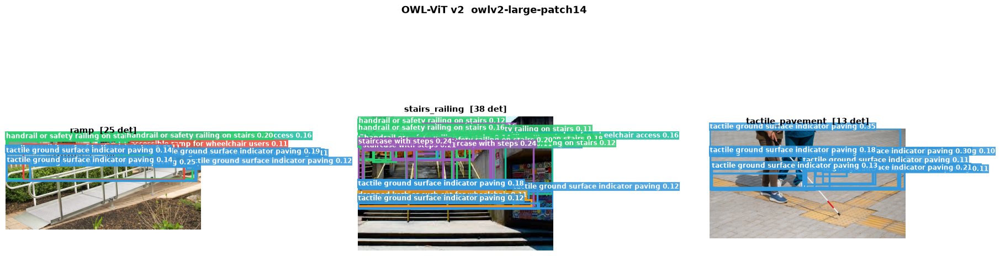

── owlv2-large-patch14-ensemble ──


Loading weights:   0%|          | 0/610 [00:00<?, ?it/s]

  ramp: [('wide entrance door for wheelchair access', 0.194), ('wide entrance door for wheelchair access', 0.155), ('handrail or safety railing on stairs', 0.216), ('handrail or safety railing on stairs', 0.132), ('handrail or safety railing on stairs', 0.107), ('handrail or safety railing on stairs', 0.176), ('handrail or safety railing on stairs', 0.216), ('handrail or safety railing on stairs', 0.111), ('handrail or safety railing on stairs', 0.139), ('wide entrance door for wheelchair access', 0.272), ('handrail or safety railing on stairs', 0.363), ('handrail or safety railing on stairs', 0.108), ('handrail or safety railing on stairs', 0.122), ('handrail or safety railing on stairs', 0.131), ('wide entrance door for wheelchair access', 0.115), ('handrail or safety railing on stairs', 0.39), ('handrail or safety railing on stairs', 0.11), ('handrail or safety railing on stairs', 0.153), ('handrail or safety railing on stairs', 0.101), ('handrail or safety railing on stairs', 0.113

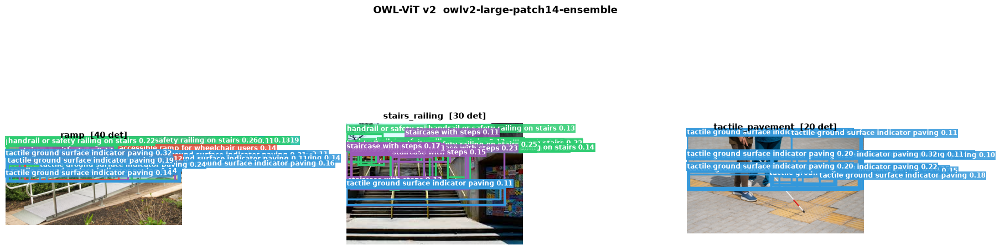

In [6]:
from transformers import Owlv2Processor, Owlv2ForObjectDetection

OWLV2_VARIANTS = [
    'google/owlv2-base-patch16',
    'google/owlv2-large-patch14',
    'google/owlv2-large-patch14-ensemble',
]

OWLV2_THRESH = 0.10
owlv2_results = {}   # keyed by short model name

def run_owlv2(model_id, images):
    proc  = Owlv2Processor.from_pretrained(model_id)
    model = Owlv2ForObjectDetection.from_pretrained(model_id).to(DEVICE)
    labels = [[f'a photo of a {c}' for c in CLASSES]]
    out = {}
    for name, img in images.items():
        inputs = proc(text=labels, images=img, return_tensors='pt').to(DEVICE)
        with torch.no_grad():
            outputs = model(**inputs)
        scores     = torch.sigmoid(outputs.logits[0])
        max_sc, lids = scores.max(dim=-1)
        boxes_norm = outputs.pred_boxes[0]
        keep = max_sc > OWLV2_THRESH
        W, H = float(img.width), float(img.height)
        cx, cy, bw, bh = boxes_norm[keep].unbind(-1)
        x0 = ((cx - bw/2)*W).clamp(0, W)
        y0 = ((cy - bh/2)*H).clamp(0, H)
        x1 = ((cx + bw/2)*W).clamp(0, W)
        y1 = ((cy + bh/2)*H).clamp(0, H)
        dets = [
            {'label': CLASSES[int(lids[keep][i])],
             'score': round(float(max_sc[keep][i]), 3),
             'box':   [round(float(v), 1) for v in (x0[i], y0[i], x1[i], y1[i])]}
            for i in range(keep.sum().item())
        ]
        out[name] = dets
        print(f'  {name}: {[(d["label"], d["score"]) for d in dets]}')
    free_gpu(model)
    return out

for model_id in OWLV2_VARIANTS:
    short = model_id.split('/')[-1]
    print(f'── {short} ──')
    owlv2_results[short] = run_owlv2(model_id, IMAGES)
    show_detections(IMAGES, owlv2_results[short], title=f'OWL-ViT v2  {short}', score_thresh=OWLV2_THRESH)

---
## 3. GroundingDINO
Best zero-shot text→box detection. Tested at two scales.

Caption: accessible ramp for wheelchair users . tactile ground surface indicator paving . handrail or safety railing on stairs . dropped kerb or curb cut for wheelchair . staircase with steps . wide entrance door for wheelchair access .

── GroundingDINO-Tiny ──


Loading weights:   0%|          | 0/978 [00:00<?, ?it/s]

  ramp: [('wide entrance door', 0.325), ('accessible ramp', 0.27), ('handrail staircase', 0.292), ('accessible ramp tactile ground surface indicator kerb', 0.276), ('staircase steps', 0.295)]
  stairs_railing: [('handrail', 0.371), ('handrail', 0.364), ('handrail', 0.325), ('stairs staircase with steps', 0.403), ('wide entrance door', 0.464), ('handrail', 0.268), ('stairs staircase with steps', 0.29), ('handrail', 0.266)]
  tactile_pavement: [('handrail', 0.528), ('accessible ramp kerb', 0.312), ('wide entrance door', 0.296), ('accessible ramp with steps', 0.295)]


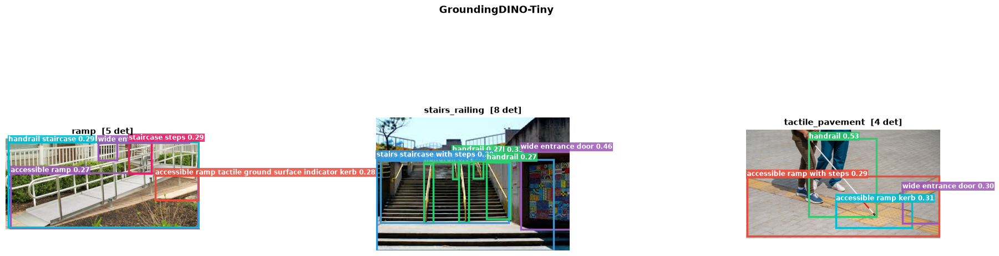


── GroundingDINO-Base ──


Loading weights:   0%|          | 0/1182 [00:00<?, ?it/s]

  ramp: [('wide entrance door', 0.359), ('tactile ground surface indicator kerb', 0.292), ('accessible ramp', 0.286), ('handrail', 0.324), ('wide entrance door', 0.282), ('staircase steps', 0.345), ('accessible ramp', 0.281), ('handrail', 0.276)]
  stairs_railing: [('stairs staircase with steps', 0.39), ('handrail', 0.295), ('handrail', 0.315), ('wide entrance door', 0.481), ('handrail', 0.287), ('handrail', 0.283), ('handrail', 0.313)]
  tactile_pavement: [('handrail railing', 0.511), ('accessible ramp kerb', 0.28)]


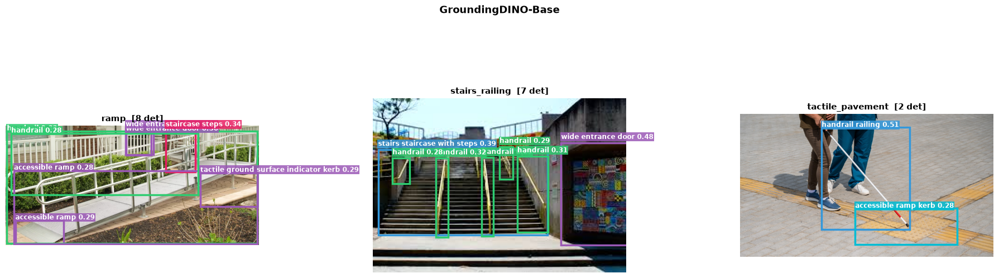

In [7]:
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

BOX_THRESH  = 0.25
TEXT_THRESH = 0.20
CAPTION = ' . '.join(CLASSES) + ' .'   # period-separated caption
print('Caption:', CAPTION)

def run_gdino(model_id, images):
    proc  = AutoProcessor.from_pretrained(model_id)
    model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(DEVICE)
    out = {}
    for name, img in images.items():
        inputs = proc(images=img, text=CAPTION, return_tensors='pt').to(DEVICE)
        with torch.no_grad():
            outputs = model(**inputs)
        res = proc.post_process_grounded_object_detection(
            outputs, inputs['input_ids'],
            threshold=BOX_THRESH, text_threshold=TEXT_THRESH,
            target_sizes=[img.size[::-1]],
        )[0]
        out[name] = [
            {'label': lbl, 'score': round(float(s), 3), 'box': [round(v,1) for v in b.tolist()]}
            for s, lbl, b in zip(res['scores'], res['labels'], res['boxes'])
        ]
        print(f'  {name}: {[(d["label"], d["score"]) for d in out[name]]}')
    free_gpu(model)
    return out

print('\n── GroundingDINO-Tiny ──')
gdino_tiny_results = run_gdino('IDEA-Research/grounding-dino-tiny', IMAGES)
show_detections(IMAGES, gdino_tiny_results, title='GroundingDINO-Tiny', score_thresh=BOX_THRESH)

print('\n── GroundingDINO-Base ──')
gdino_base_results = run_gdino('IDEA-Research/grounding-dino-base', IMAGES)
show_detections(IMAGES, gdino_base_results, title='GroundingDINO-Base', score_thresh=BOX_THRESH)

---
## 3b. GroundingDINO-Base — Threshold Sweep
Same model, different `threshold` values side by side.  
Low = more detections, more false positives. High = fewer, more confident.

Loading weights:   0%|          | 0/1182 [00:00<?, ?it/s]

Saved ../../../../datasets/test_classes/thresh_sweep\thresh_0p05.png


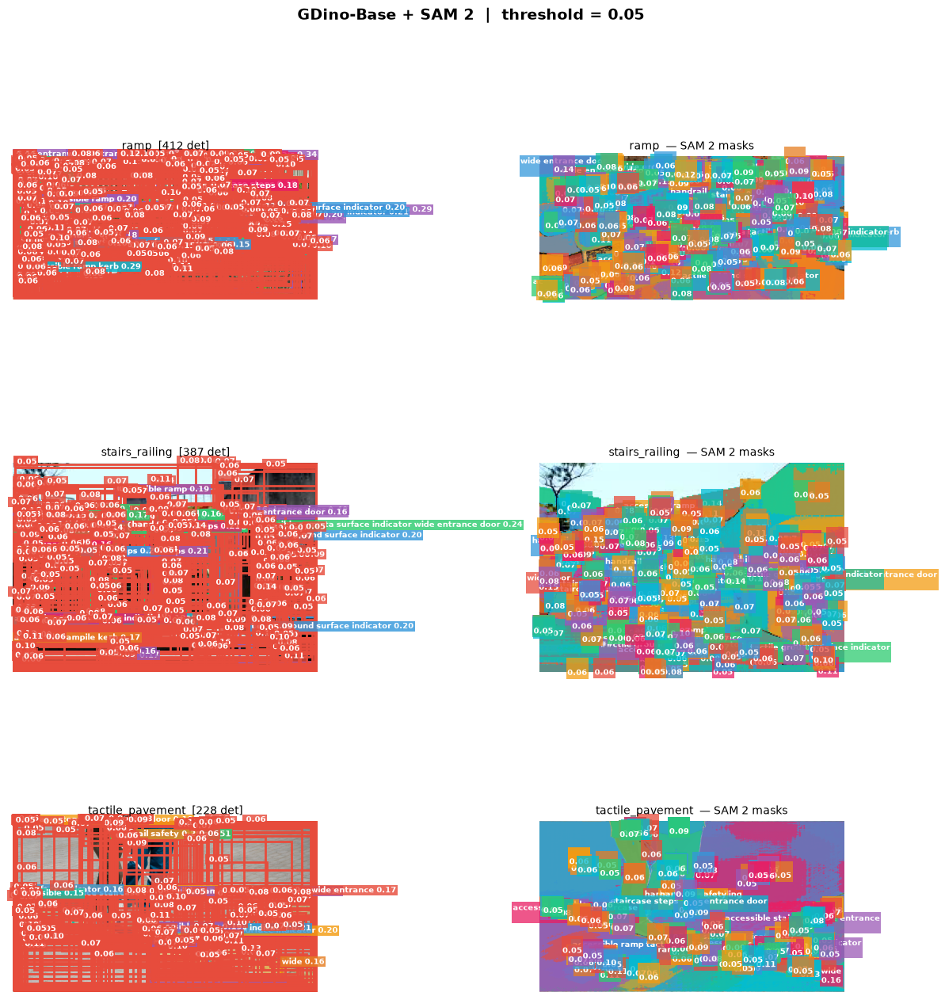

In [ ]:
import os
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

THRESHOLDS  = [0.05, 0.10, 0.15, 0.20, 0.25, 0.35, 0.50]
TEXT_THRESH = 0.15
SAVE_DIR    = '../../../../datasets/test_classes/thresh_sweep'
os.makedirs(SAVE_DIR, exist_ok=True)

# Step 1: GDino-Base collect all candidates at threshold=0.01
proc  = AutoProcessor.from_pretrained('IDEA-Research/grounding-dino-base')
model = AutoModelForZeroShotObjectDetection.from_pretrained('IDEA-Research/grounding-dino-base').to(DEVICE)

raw_outputs = {}
for name, img in IMAGES.items():
    inputs = proc(images=img, text=CAPTION, return_tensors='pt').to(DEVICE)
    with torch.no_grad():
        outputs = model(**inputs)
    res = proc.post_process_grounded_object_detection(
        outputs, inputs['input_ids'],
        threshold=0.01, text_threshold=TEXT_THRESH,
        target_sizes=[img.size[::-1]],
    )[0]
    raw_outputs[name] = [
        (float(s), lbl, [round(v, 1) for v in b.tolist()])
        for s, lbl, b in zip(res['scores'], res['labels'], res['boxes'])
    ]
free_gpu(model)

# Step 2: Load SAM 2
sam2 = SAM2ImagePredictor.from_pretrained('facebook/sam2-hiera-small')

# Step 3: For each threshold -> segment -> visualise -> save
for thresh in THRESHOLDS:
    fig, axes = plt.subplots(len(IMAGES), 2, figsize=(12, 4.5 * len(IMAGES)))
    fig.suptitle(f'GDino-Base + SAM 2  |  threshold = {thresh}',
                 fontsize=14, fontweight='bold', y=1.01)

    for row, (img_name, img) in enumerate(IMAGES.items()):
        img_np = np.array(img)
        dets   = [(s, lbl, box) for s, lbl, box in raw_outputs[img_name] if s >= thresh]

        # left: bounding boxes
        ax_box = axes[row][0]
        ax_box.imshow(img)
        for s, lbl, box in dets:
            x0, y0, x1, y1 = box
            c = color_for(lbl)
            ax_box.add_patch(patches.Rectangle(
                (x0, y0), x1-x0, y1-y0, lw=2, edgecolor=c, facecolor='none'))
            ax_box.text(x0, max(y0-3, 0), f'{lbl} {s:.2f}',
                        color='white', fontsize=7.5, fontweight='bold',
                        bbox=dict(facecolor=c, alpha=0.82, pad=1, edgecolor='none'))
        ax_box.set_title(f'{img_name}  [{len(dets)} det]', fontsize=10)
        ax_box.axis('off')

        # right: SAM 2 masks
        ax_mask = axes[row][1]
        overlay = img_np.astype(np.float32) / 255.0

        if dets:
            boxes_np = np.array([d[2] for d in dets], dtype=np.float32)
            with torch.inference_mode(), torch.autocast(DEVICE, dtype=torch.float16):
                sam2.set_image(img_np)
                masks, _, _ = sam2.predict(
                    point_coords=None, point_labels=None,
                    box=boxes_np, multimask_output=False,
                )
            if masks.ndim == 4:
                masks = masks[:, 0]
            for i, (s, lbl, box) in enumerate(dets):
                mask = masks[i].astype(bool)
                hex_c = COLORS[i % len(COLORS)].lstrip('#')
                clr   = np.array([int(hex_c[j:j+2], 16)/255 for j in (0, 2, 4)])
                overlay[mask] = overlay[mask] * 0.35 + clr * 0.65
                ys, xs = np.where(mask)
                if len(xs):
                    ax_mask.text(xs.mean(), ys.mean(), f'{lbl}\n{s:.2f}',
                                 ha='center', va='center', fontsize=7,
                                 color='white', fontweight='bold',
                                 bbox=dict(facecolor=COLORS[i % len(COLORS)],
                                           alpha=0.75, pad=1, edgecolor='none'))

        ax_mask.imshow(np.clip(overlay, 0, 1))
        ax_mask.set_title(f'{img_name}  — SAM 2 masks', fontsize=10)
        ax_mask.axis('off')

    plt.tight_layout()
    save_path = os.path.join(SAVE_DIR, f'thresh_{str(thresh).replace(".", "p")}.png')
    plt.savefig(save_path, dpi=110, bbox_inches='tight')
    print(f'Saved {save_path}')
    plt.show()

free_gpu(sam2)

# Step 4: Count table
print(f'\n{"image":<22}', end='')
for t in THRESHOLDS: print(f'  {t:<6}', end='')
print()
print('-' * (22 + 8 * len(THRESHOLDS)))
for img_name in IMAGES:
    print(f'{img_name:<22}', end='')
    for t in THRESHOLDS:
        n = sum(1 for s, _, __ in raw_outputs[img_name] if s >= t)
        print(f'  {n:<6}', end='')
    print()

---
## 5. GroundingDINO-Base + SAM 2
GDino detects, SAM 2 segments pixel-precise masks.

In [ ]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_predictor = SAM2ImagePredictor.from_pretrained('facebook/sam2-hiera-small')
print('SAM 2 (hiera-small) loaded')

SAM 2 (hiera-small) loaded


ramp: ['railingrail', 'tactile paving stairs', 'ramp', 'railing', 'handrail']
stairs_railing: ['stairs', 'wide door', 'railing', 'railing', 'wide door']
tactile_pavement: no GDino boxes — skipping


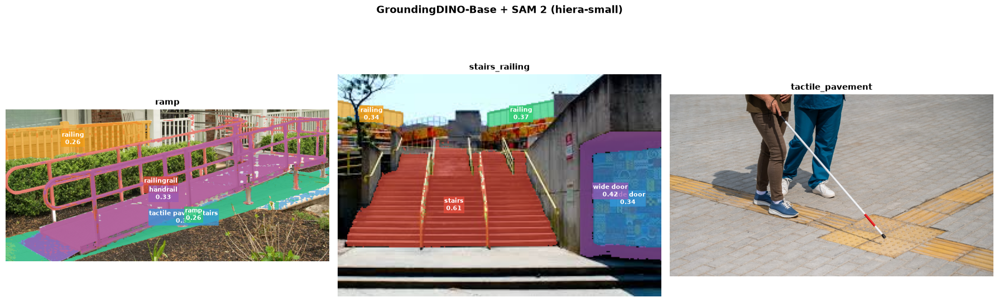

In [ ]:
sam2_results = {}
for name, img in IMAGES.items():
    dets = gdino_base_results.get(name, [])
    if not dets:
        print(f'{name}: no GDino boxes — skipping')
        sam2_results[name] = []; continue
    img_np = np.array(img)
    boxes  = np.array([d['box'] for d in dets], dtype=np.float32)
    with torch.inference_mode(), torch.autocast(DEVICE, dtype=torch.float16):
        sam2_predictor.set_image(img_np)
        masks, scores, _ = sam2_predictor.predict(
            point_coords=None, point_labels=None, box=boxes, multimask_output=False
        )
    if masks.ndim == 4: masks = masks[:, 0]   # (N,1,H,W) → (N,H,W)
    sam2_results[name] = [
        {'label': d['label'], 'score': d['score'], 'mask': masks[i].astype(bool), 'box': d['box']}
        for i, d in enumerate(dets)
    ]
    print(f'{name}: {[s["label"] for s in sam2_results[name]]}')

show_masks(IMAGES, sam2_results, title='GroundingDINO-Base + SAM 2 (hiera-small)')

---
## 6. Project Sidewalk — Specialized Classifiers
Binary classifiers trained on 210K+ annotated Google Street View images.  
Each model answers: *"does this image contain X?"*

Models:
- `projectsidewalk/sidewalk-validator-ai-curbramp`
- `projectsidewalk/sidewalk-validator-ai-surfaceproblem`
- `projectsidewalk/sidewalk-validator-ai-obstacle`
- `projectsidewalk/sidewalk-validator-ai-crosswalk`

These are **not** open-vocab — they only detect their specific feature.

In [ ]:
from transformers import AutoImageProcessor, AutoModelForImageClassification

PSW_MODELS = {
    'curb ramp':       'projectsidewalk/sidewalk-validator-ai-curbramp',
    'surface problem': 'projectsidewalk/sidewalk-validator-ai-surfaceproblem',
    'obstacle':        'projectsidewalk/sidewalk-validator-ai-obstacle',
    'crosswalk':       'projectsidewalk/sidewalk-validator-ai-crosswalk',
}

psw_results = {img_name: {} for img_name in IMAGES}

for feature_name, model_id in PSW_MODELS.items():
    print(f'Loading {feature_name}…')
    processor = AutoImageProcessor.from_pretrained(model_id)
    clf_model = AutoModelForImageClassification.from_pretrained(model_id).to(DEVICE)
    clf_model.eval()
    for img_name, img in IMAGES.items():
        inputs = processor(images=img, return_tensors='pt').to(DEVICE)
        with torch.no_grad():
            logits = clf_model(**inputs).logits
        probs = torch.softmax(logits, dim=-1)[0]
        id2label = clf_model.config.id2label
        pred_id  = int(probs.argmax())
        pred_lbl = id2label[pred_id]
        confidence = round(float(probs[pred_id]), 3)
        psw_results[img_name][feature_name] = {
            'label': pred_lbl, 'confidence': confidence, 'probs': probs.cpu().tolist()
        }
    free_gpu(clf_model)

# Results table
print(f'\n{"": <20}', end='')
for fn in PSW_MODELS: print(f'  {fn:<17}', end='')
print()
print('-' * (20 + 19*len(PSW_MODELS)))
for img_name in IMAGES:
    print(f'{img_name:<20}', end='')
    for fn in PSW_MODELS:
        r = psw_results[img_name][fn]
        probs = r['probs']
        pos = probs[1] if len(probs) > 1 else probs[0]
        flag = '✓' if pos > 0.5 else '✗'
        print(f'  {flag} {r["label"]:<8} {pos:.2f}  ', end='')
    print()

Loading curb ramp…


Loading weights:   0%|          | 0/441 [00:00<?, ?it/s]

Loading surface problem…


Loading weights:   0%|          | 0/441 [00:00<?, ?it/s]

Loading obstacle…


Loading weights:   0%|          | 0/441 [00:00<?, ?it/s]

Loading crosswalk…


Loading weights:   0%|          | 0/441 [00:00<?, ?it/s]


                      curb ramp          surface problem    obstacle           crosswalk        
------------------------------------------------------------------------------------------------
ramp                  ✓ incorrect 0.99    ✗ correct  0.33    ✗ correct  0.32    ✓ incorrect 0.99  
stairs_railing        ✓ incorrect 1.00    ✓ incorrect 0.69    ✓ incorrect 0.82    ✓ incorrect 0.93  
tactile_pavement      ✗ correct  0.04    ✓ incorrect 0.97    ✓ incorrect 0.72    ✓ incorrect 1.00  


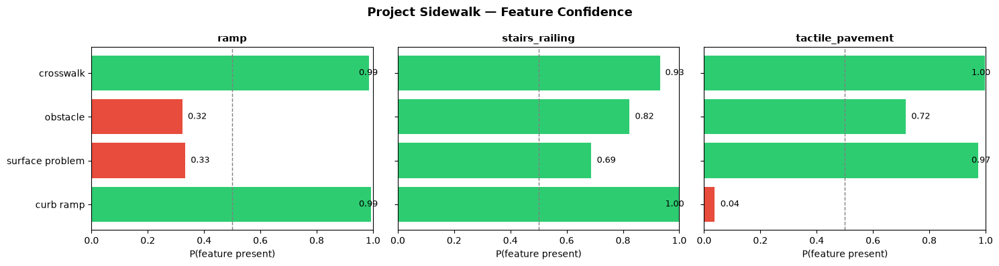

In [ ]:
# Visualise Project Sidewalk scores as a heatmap bar chart
features = list(PSW_MODELS.keys())
image_names = list(IMAGES.keys())

fig, axes = plt.subplots(1, len(image_names), figsize=(5*len(image_names), 4), sharey=True)
for ax, img_name in zip(axes, image_names):
    # Get the 'positive' class probability for each feature
    scores = []
    for fn in features:
        r = psw_results[img_name][fn]
        id2label = {v: k for k, v in enumerate(r['probs'])}  # fallback
        # Try to get the probability of label '1' or 'positive'
        probs = r['probs']
        pos_score = probs[1] if len(probs) > 1 else probs[0]
        scores.append(pos_score)
    bars = ax.barh(features, scores, color=['#2ecc71' if s > 0.5 else '#e74c3c' for s in scores])
    ax.axvline(0.5, color='gray', linestyle='--', linewidth=1)
    ax.set_xlim(0, 1)
    ax.set_title(img_name, fontsize=11, fontweight='bold')
    ax.set_xlabel('P(feature present)')
    for bar, s in zip(bars, scores):
        ax.text(min(s+0.02, 0.95), bar.get_y()+bar.get_height()/2,
                f'{s:.2f}', va='center', fontsize=9)
plt.suptitle('Project Sidewalk — Feature Confidence', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

---
## 8. Side-by-side comparison — zero-shot models

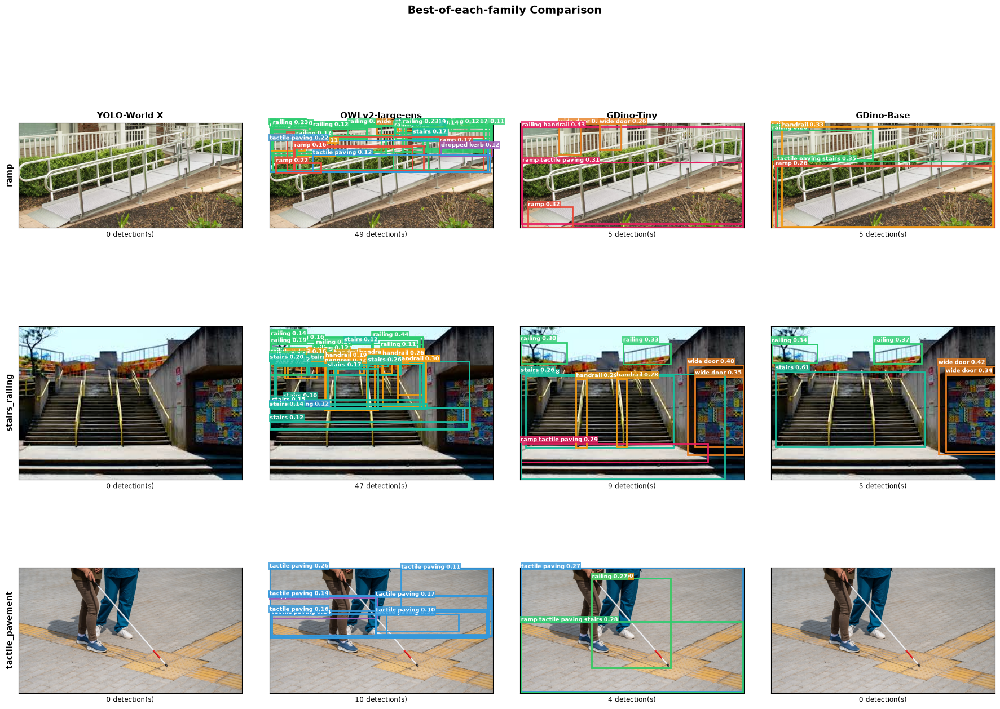

In [ ]:
# Best result from each family for the grid
MODEL_RESULTS = [
    ('YOLO-World X',        yolo_results['X'],                                    0.15),
    ('OWLv2-large-ens',     owlv2_results['owlv2-large-patch14-ensemble'],        0.10),
    ('GDino-Tiny',          gdino_tiny_results,                                   0.25),
    ('GDino-Base',          gdino_base_results,                                   0.25),
]

n_imgs, n_models = len(IMAGES), len(MODEL_RESULTS)
fig, axes = plt.subplots(n_imgs, n_models, figsize=(4.5*n_models, 4.5*n_imgs))

for row, (img_name, img) in enumerate(IMAGES.items()):
    for col, (model_name, results, thresh) in enumerate(MODEL_RESULTS):
        ax = axes[row][col]
        ax.imshow(img)
        dets = [d for d in results.get(img_name, []) if d['score'] >= thresh]
        for det in dets:
            x0, y0, x1, y1 = det['box']
            c = color_for(det['label'])
            ax.add_patch(patches.Rectangle((x0,y0), x1-x0, y1-y0, lw=2, edgecolor=c, facecolor='none'))
            ax.text(x0, max(y0-3,0), f"{det['label']} {det['score']:.2f}",
                    color='white', fontsize=7, fontweight='bold',
                    bbox=dict(facecolor=c, alpha=0.8, pad=1, edgecolor='none'))
        if row == 0: ax.set_title(model_name, fontsize=11, fontweight='bold', pad=6)
        if col == 0: ax.set_ylabel(img_name, fontsize=10, fontweight='bold', labelpad=6)
        ax.set_xlabel(f'{len(dets)} detection(s)', fontsize=8.5)
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

plt.suptitle('Best-of-each-family Comparison', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('../../../../datasets/test_classes/comparison_zeroshot.png', dpi=110, bbox_inches='tight')
plt.show()

---
## 9. Summary

In [ ]:
print('── YOLO-World across sizes ──────────────────────────────────────────────')
header = f'{"": <20}' + ''.join(f'{"YW-"+v:<12}' for v in yolo_results)
print(header); print('-'*len(header))
for img_name in IMAGES:
    row = f'{img_name:<20}'
    for v, res in yolo_results.items():
        n = len([d for d in res.get(img_name, []) if d['score'] >= 0.15])
        row += f'{n:<12}'
    print(row)

print('\n── OWL-ViT v2 across sizes ─────────────────────────────────────────────')
header = f'{"": <20}' + ''.join(f'{k[-12:]:<20}' for k in owlv2_results)
print(header); print('-'*len(header))
for img_name in IMAGES:
    row = f'{img_name:<20}'
    for res in owlv2_results.values():
        n = len([d for d in res.get(img_name, []) if d['score'] >= 0.10])
        row += f'{n:<20}'
    print(row)

print('\n── GroundingDINO ────────────────────────────────────────────────────────')
for img_name in IMAGES:
    nt = len([d for d in gdino_tiny_results.get(img_name, []) if d['score'] >= 0.25])
    nb = len([d for d in gdino_base_results.get(img_name, []) if d['score'] >= 0.25])
    print(f'  {img_name:<22}  Tiny={nt}  Base={nb}')

print('\n── Project Sidewalk specialized classifiers ────────────────────────────')
for img_name in IMAGES:
    print(f'\n{img_name}:')
    for fn in PSW_MODELS:
        r = psw_results[img_name][fn]
        probs = r['probs']
        pos = probs[1] if len(probs) > 1 else probs[0]
        print(f'  {fn:<20}  {"DETECTED" if pos > 0.5 else "not found":<10}  conf={pos:.3f}')

print('\n── SAM 2 masks ─────────────────────────────────────────────────────────')
for name, segs in sam2_results.items():
    print(f'  {name}: {[s["label"] for s in segs]}')

── YOLO-World across sizes ──────────────────────────────────────────────
                    YW-S        YW-M        YW-L        YW-X        
--------------------------------------------------------------------
ramp                0           0           0           0           
stairs_railing      0           0           1           0           
tactile_pavement    0           0           0           0           

── OWL-ViT v2 across sizes ─────────────────────────────────────────────
                    base-patch16        arge-patch14        h14-ensemble        
--------------------------------------------------------------------------------
ramp                23                  17                  49                  
stairs_railing      29                  42                  47                  
tactile_pavement    4                   8                   10                  

── GroundingDINO ────────────────────────────────────────────────────────
  ramp                    T

In [ ]:
if torch.cuda.is_available():
    alloc    = torch.cuda.memory_allocated() / 1e9
    reserved = torch.cuda.memory_reserved() / 1e9
    total    = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f'VRAM allocated : {alloc:.2f} GB')
    print(f'VRAM reserved  : {reserved:.2f} GB  (peak usage)')
    print(f'VRAM total     : {total:.2f} GB')
    print(f'VRAM headroom  : {total - reserved:.2f} GB')
else:
    print('Running on CPU')

VRAM allocated : 3.50 GB
VRAM reserved  : 3.73 GB  (peak usage)
VRAM total     : 8.59 GB
VRAM headroom  : 4.86 GB
